In [1]:
from constants import TRAIN_AUTOENCODER_FLUXES_PATH, \
                      TRAIN_AUTOENCODER_AMP_PHASE_PATH, \
                      VALIDATION_AUTOENCODER_FLUXES_PATH, \
                      VALIDATION_AUTOENCODER_AMP_PHASE_PATH


from plot_utils import plot_map, \
                       plot_model_history, \
                       plot_autoencoder, \
                       plot_enc_conv_amp_phase_prediction


from data_utils import load_numpy_data


from modeling_utils import create_autoencoder_for_flux, \
                           create_convolutional_architecture_with_encoder_for_amplitude_phase_reconstruction, \
                           compile_model, \
                           train_model_with_generator, \
                           store_model, \
                           load_model

from configurations import EncoderConvolutionalConfiguration

2024-02-21 12:13:55.142669: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-21 12:13:55.187581: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-21 12:13:55.187611: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-21 12:13:55.188723: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-21 12:13:55.195801: I tensorflow/core/platform/cpu_feature_guar

In [2]:
validation_fluxes_array = load_numpy_data(VALIDATION_AUTOENCODER_FLUXES_PATH)
validation_amp_phase_array = load_numpy_data(VALIDATION_AUTOENCODER_AMP_PHASE_PATH)

In [3]:
validation_amp_phase_array.shape

(10000, 112, 96, 2)

In [4]:
autoencoder_model = load_model("NewFluxAutoencoder80000-1")

2024-02-21 12:13:57.783286: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-21 12:13:57.933319: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-21 12:13:57.934189: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [5]:
model_configuration = EncoderConvolutionalConfiguration()

In [6]:
enc_conv_model = create_convolutional_architecture_with_encoder_for_amplitude_phase_reconstruction(
    autoencoder_model,
    *model_configuration.unpack_architecture_hyperparameters())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1_input (InputLayer)   [(None, 56, 24, 1)]       0         
                                                                 
 conv_1 (Conv2D)             (None, 56, 24, 512)       5120      
                                                                 
 conv_2 (Conv2D)             (None, 56, 24, 512)       2359808   
                                                                 
 max_pooling2d (MaxPooling2  (None, 28, 12, 512)       0         
 D)                                                              
                                                                 
 conv_1-0 (Conv2D)           (None, 28, 12, 128)       589952    
                                                                 
 conv_1-1 (Conv2D)           (None, 28, 12, 128)       147584    
                                                             

In [7]:
compile_model(
    enc_conv_model,
    *model_configuration.unpack_compilation_hyperparameters()
)

In [8]:
validation_amp_phase_array.shape

(10000, 112, 96, 2)

In [9]:
history = train_model_with_generator(
    enc_conv_model,
    TRAIN_AUTOENCODER_FLUXES_PATH,
    TRAIN_AUTOENCODER_AMP_PHASE_PATH,
    validation_fluxes_array,
    validation_amp_phase_array,
    *model_configuration.unpack_training_hyperparameters(),
    n_samples=30000
)

Epoch 1/100


2024-02-21 12:14:10.229553: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-02-21 12:14:10.389996: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-02-21 12:14:12.807033: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-02-21 12:14:15.015148: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f5a5e25b8f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-02-21 12:14:15.015182: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 Laptop GPU, Compute Capability 8.9
2024-02-21 12:14:15.021783: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1708478055.341777   22642 devic

938/938 [==============================] - 157s 149ms/step - loss: 0.1713 - mean_squared_error: 0.1713 - val_loss: 0.1967 - val_mean_squared_error: 0.1967 - lr: 1.0000e-04
Epoch 2/100
938/938 [==============================] - 135s 144ms/step - loss: 0.1070 - mean_squared_error: 0.1070 - val_loss: 0.1663 - val_mean_squared_error: 0.1663 - lr: 1.0000e-04
Epoch 3/100
938/938 [==============================] - 135s 144ms/step - loss: 0.0925 - mean_squared_error: 0.0925 - val_loss: 0.1464 - val_mean_squared_error: 0.1464 - lr: 1.0000e-04
Epoch 4/100
938/938 [==============================] - 135s 144ms/step - loss: 0.0843 - mean_squared_error: 0.0843 - val_loss: 0.1342 - val_mean_squared_error: 0.1342 - lr: 1.0000e-04
Epoch 5/100
938/938 [==============================] - 136s 145ms/step - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.1268 - val_mean_squared_error: 0.1268 - lr: 1.0000e-04
Epoch 6/100
938/938 [==============================] - 136s 145ms/step - loss: 0.0738 - mean

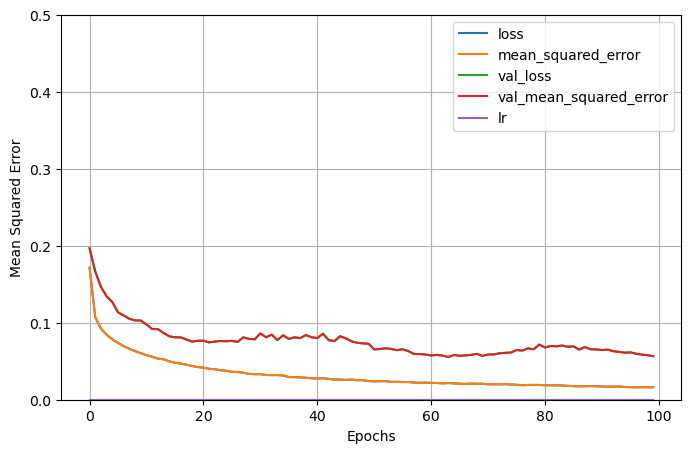

In [10]:
plot_model_history(history)

1/1 [==============================] - 1s 873ms/step


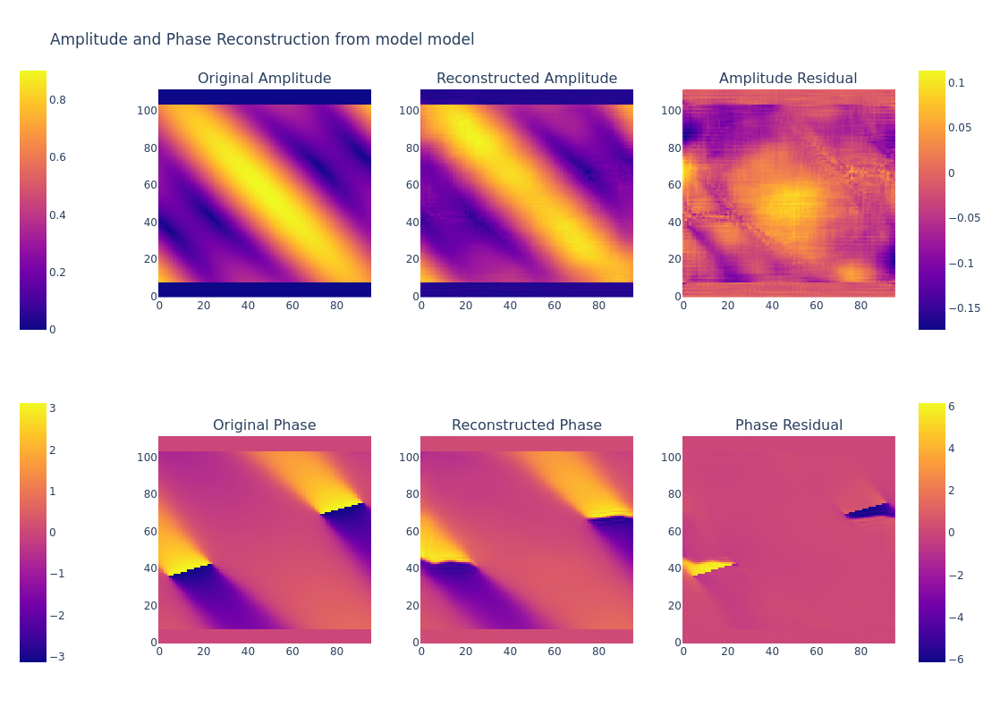

In [11]:
plot_enc_conv_amp_phase_prediction(enc_conv_model,
                                   validation_fluxes_array[106], 
                                   validation_amp_phase_array[106])

In [12]:
from constants import TRAIN_AUTOENCODER_AMP_PHASE_PATH
train_fluxes_array = load_numpy_data(f"{TRAIN_AUTOENCODER_FLUXES_PATH}00.npy")
train_amp_phase_array = load_numpy_data(f"{TRAIN_AUTOENCODER_AMP_PHASE_PATH}00.npy")

1/1 [==============================] - 0s 39ms/step


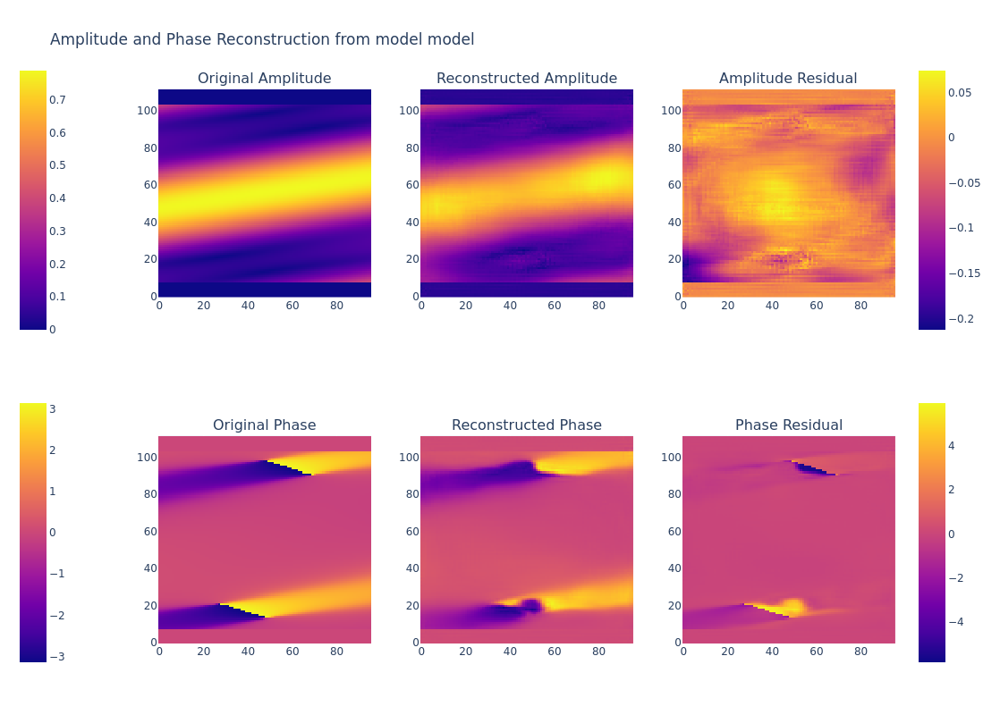

In [13]:
plot_enc_conv_amp_phase_prediction(enc_conv_model,
                                   train_fluxes_array[106], 
                                   train_amp_phase_array[106])

In [14]:
store_model(enc_conv_model,
            enc_conv_model.name,
            model_configuration.get_description(),
            history.history['mean_squared_error'][-1],
            history.history['val_mean_squared_error'][-1])